# Classification Of Laryngeal Tissues using Hybrid Texture Feature Extraction Technique and Machine Learning Algorithm

# Importing Libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import data
import PIL
from PIL import Image
from PIL import Image, ImageFilter
import pandas as pd
import tqdm
import pickle
import cv2
from skimage.morphology import extrema
from skimage.morphology import watershed as skwater
import os
from skimage.filters import gabor
from skimage.feature import local_binary_pattern, greycomatrix, greycoprops

# Segmentation Of Image (Endoscopy,Threshold,Water-shaded View)

['cropped1.png', 'cropped10.png', 'cropped100.png', 'cropped1000.png', 'cropped1001.png', 'cropped1002.png', 'cropped1003.png', 'cropped1004.png', 'cropped1005.png', 'cropped1006.png', 'cropped1007.png', 'cropped1008.png', 'cropped1009.png', 'cropped101.png', 'cropped1010.png', 'cropped1011.png', 'cropped1012.png', 'cropped1013.png', 'cropped1014.png', 'cropped1015.png', 'cropped1016.png', 'cropped1017.png', 'cropped1018.png', 'cropped1019.png', 'cropped102.png', 'cropped1020.png', 'cropped1021.png', 'cropped1022.png', 'cropped1023.png', 'cropped1024.png', 'cropped1025.png', 'cropped1026.png', 'cropped1027.png', 'cropped1028.png', 'cropped1029.png', 'cropped103.png', 'cropped1030.png', 'cropped1031.png', 'cropped1032.png', 'cropped1033.png', 'cropped1034.png', 'cropped1035.png', 'cropped1036.png', 'cropped1037.png', 'cropped1038.png', 'cropped1039.png', 'cropped104.png', 'cropped1040.png', 'cropped1041.png', 'cropped1042.png', 'cropped1043.png', 'cropped1044.png', 'cropped1045.png', 'c

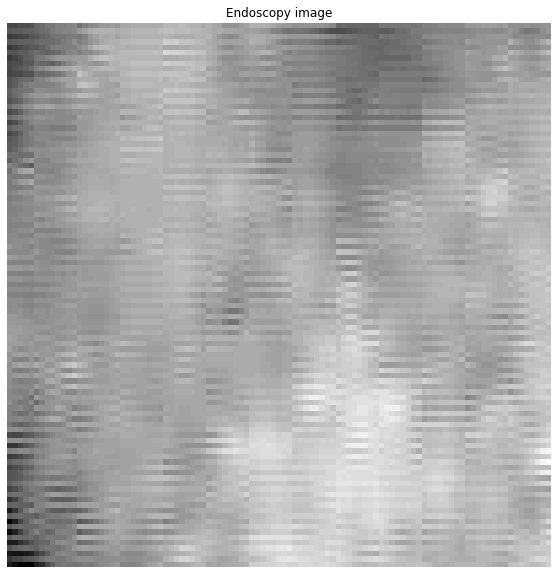

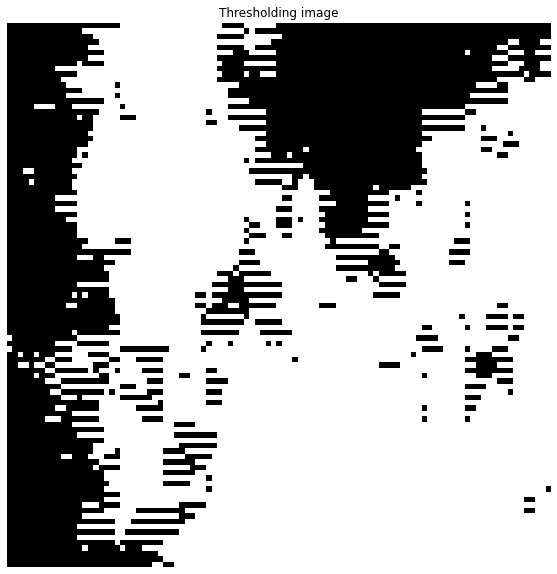

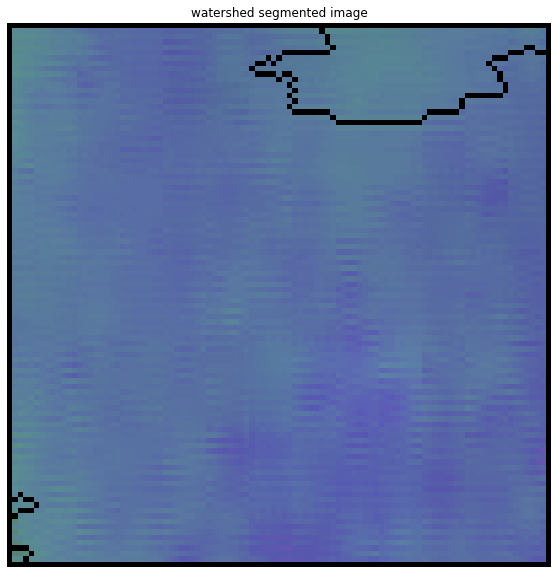

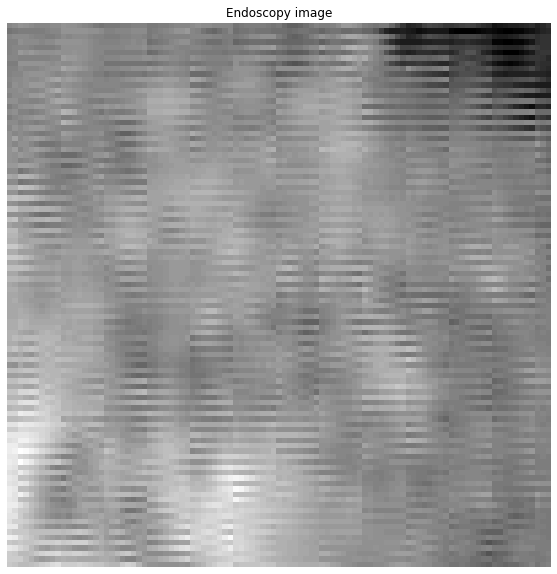

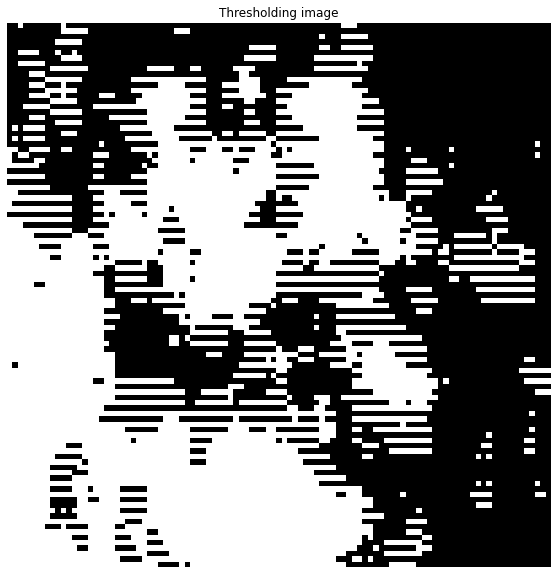

...

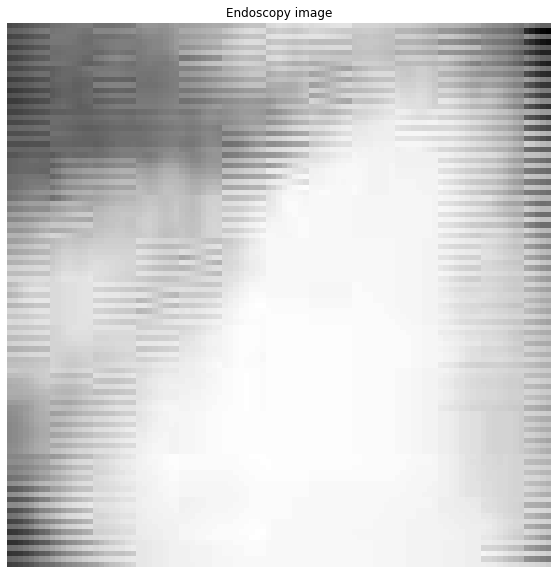

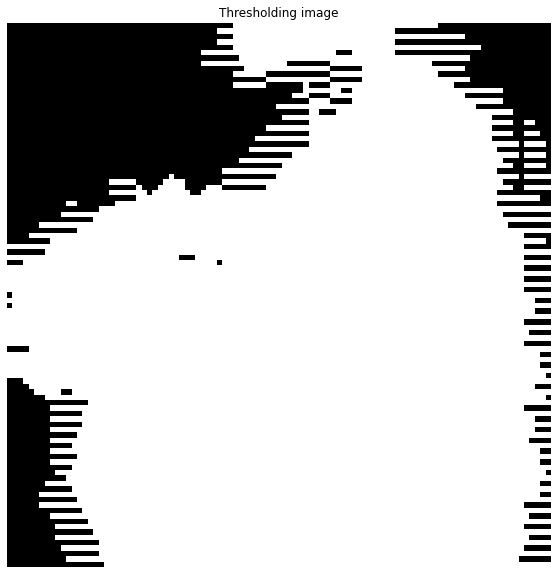

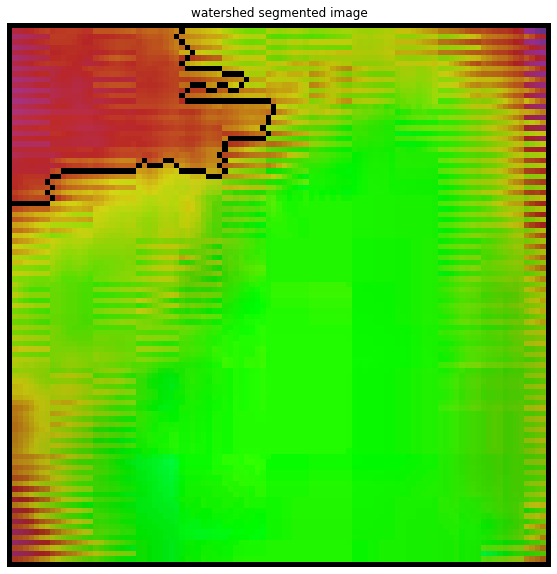

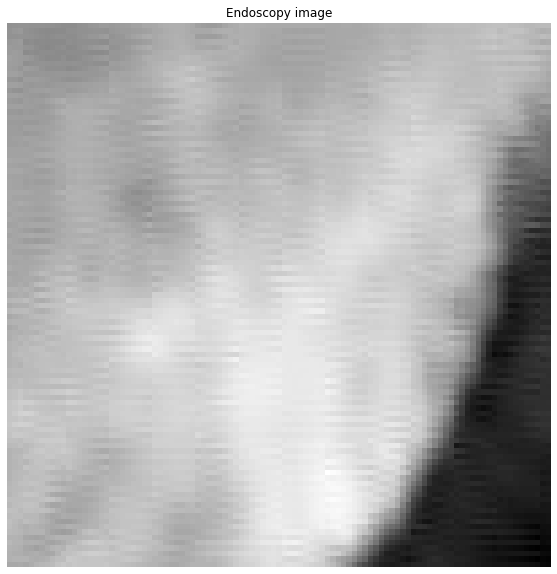

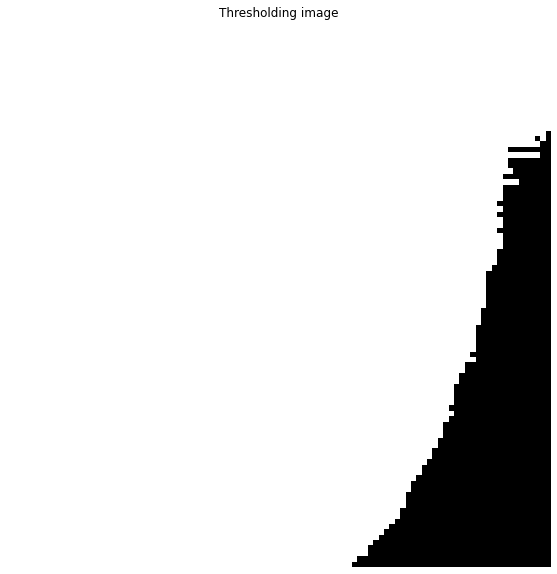

ValueError: attempt to get argmax of an empty sequence

In [2]:
def ShowImage(title,img,ctype):
    plt.figure(figsize=(10,10))
    if ctype=='bgr':
        b,g,r=cv2.split(img) #get b,g,r
        rbg_img=cv2.merge([r,g,b])
        plt.imshow(rgb_img)
    elif ctype=='hsv':
        rgb=cv2.cvtColor(img,cv2.COLOR_HSB2RGB)
        plt.imshow(rgb)
    elif ctype=='gray':
        plt.imshow(img,cmap='gray')
    elif ctype=='rgb':
        plt.imshow(img)
    else:  
        raise Exception("Unknown color type")
    plt.axis('off')
    plt.title(title)
    plt.show()
    
def seg(l):
    img =cv2.imread(l)
    gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ShowImage('Endoscopy image',gray,'gray')
    ret,thresh=cv2.threshold(gray,0,255,cv2.THRESH_OTSU)
    ShowImage('Thresholding image',thresh,'gray')
    ret,markers=cv2.connectedComponents(thresh)
    #get the area taken by each component
    marker_area=[np.sum(markers==m) for m in range(np.max(markers)) if m!=0]
    #get labels of largest component by area
    largest_component=np.argmax(marker_area)+1
    #get pixels which correspond to the brain
    brain_mask=markers==largest_component
    brain_out=img.copy()
    #in a copy of original image ,clear thosse pixels that dont correspond to brain 
    brain_out[brain_mask==False]=(0,0,0)
    img=cv2.imread(l)
    gray=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, thresh= cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    #NOISE REMOVAL
    kernel=np.ones((3,3),np.uint8)
    opening=cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel,iterations=2)
    #SURE BACKGROUND AREA
    sure_bg=cv2.dilate(opening,kernel,iterations=3)
    #finding sure background areea
    dist_transform=cv2.distanceTransform(opening,cv2.DIST_L2,5)
    ret,sure_fg=cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    
    #finding unknown region 
    sure_fg=np.uint8(sure_fg)
    unknown=cv2.subtract(sure_bg,sure_fg)
    #marker Labelling
    ret,markers=cv2.connectedComponents(sure_fg)
    
    #add one to all labels so that all background is not 0,but1
    markers=markers+1
    #now find mark the region of unknown with zero
    markers[unknown==255]=0
    markers=cv2.watershed(img,markers)
    img[markers==-1]=[255,0,0]
    im1=cv2.cvtColor(img,cv2.COLOR_HSV2RGB)
    ShowImage('watershed segmented image',im1,'gray')
    brain_mask=np.uint8(brain_mask)
    kernel=np.ones((8,8),np.uint8)
    closing=cv2.morphologyEx(brain_mask,cv2.MORPH_CLOSE,kernel)
    brain_out=img.copy()
    return[img,thresh,im1,brain_out]
path='Desktop/data/training'
data=os.listdir(path)
print(data)
dset={}
for i in data:
    dset[i]=seg(path+'/'+i)
print(dset)    

# Counting the no of Image Dataset

In [3]:
count=0
for i in data:
    count=count+1
print(count)    

660


# Visualization of Single Image from Dataset

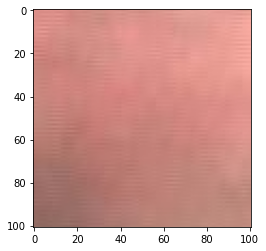

In [4]:
img = Image.open('training/cropped101.png') #PIL image
img_gray = img.convert('L') #Converting to grayscale
img_arr = np.array(img_gray) #Converting to array
plt.imshow(img)

# Feature Extraction Technique Using GLCM(Gray level co-occurance matrix)

In [5]:
# Finding GLCM features for one image data from co-occurance matrix
gCoMat = greycomatrix(img_arr, [2], [0],256,symmetric=True, normed=True) # Co-occurance matrix
contrast = greycoprops(gCoMat, prop='contrast')
dissimilarity = greycoprops(gCoMat, prop='dissimilarity')
homogeneity = greycoprops(gCoMat, prop='homogeneity')
energy = greycoprops(gCoMat, prop='energy')
correlation = greycoprops(gCoMat, prop='correlation')
print('Contrast = '+str(contrast[0][0]))
print('Dissimilarity = '+str(dissimilarity[0][0]))
print('Homogeneity = '+str(homogeneity[0][0]))
print('Energy = '+str(energy[0][0]))
print('Correlation = '+str(correlation[0][0]))

Contrast = 6.119111911191119
Dissimilarity = 1.8914891489148915
Homogeneity = 0.39851466675725616
Energy = 0.0492195539259763
Correlation = 0.9873679335184137


# 1- Generating texture data by extracting features from all images using GLCM

In [6]:
d={'tr' : [],'Contrast':[],'Dissimilarity':[],'Homogeneity':[],'Energy':[],'Correlation':[]}
i=0
df=pd.DataFrame(d)
import glob
label = []
featLength = 2+5+2
trainFeats = np.zeros((len(data),featLength)) #Feature vector of each image is of size 1x1030
imgPath = glob.glob('training/*.png')
for tr in imgPath:
    img=Image.open(tr)
    img_gray = img.convert('L') #Converting to grayscale
    img_arr = np.array(img_gray) #Converting to array
    # GLCM
    gCoMat = greycomatrix(img_arr, [2], [0],256,symmetric=True, normed=True)
    contrast = greycoprops(gCoMat, prop='contrast')
    dissimilarity = greycoprops(gCoMat, prop='dissimilarity')
    homogeneity = greycoprops(gCoMat, prop='homogeneity')    
    energy = greycoprops(gCoMat, prop='energy')
    correlation = greycoprops(gCoMat, prop='correlation')    
    feat_glcm = np.array([contrast[0][0],dissimilarity[0][0],homogeneity[0][0],energy[0][0],correlation[0][0]])
    print()
    print()
    print(tr)
    print()
    print('Contrast = '+str(contrast[0][0]))
    print('Dissimilarity = '+str(dissimilarity[0][0]))
    print('Homogeneity = '+str(homogeneity[0][0]))
    print('Energy = '+str(energy[0][0]))
    print('Correlation = '+str(correlation[0][0]))
    df.loc[i] = [tr[9:],contrast[0][0],dissimilarity[0][0],homogeneity[0][0],energy[0][0],correlation[0][0]]
    i=i+1



training\cropped1.png

Contrast = 4.678167816781679
Dissimilarity = 1.5518551855185518
Homogeneity = 0.4749003539372016
Energy = 0.09760958165472208
Correlation = 0.9257950734317185


training\cropped10.png

Contrast = 5.975197519751975
Dissimilarity = 1.8327832783278328
Homogeneity = 0.4150912077006795
Energy = 0.08677428121210926
Correlation = 0.9290416087376694


training\cropped100.png

Contrast = 4.851885188518852
Dissimilarity = 1.6755675567556758
Homogeneity = 0.43091353612491384
Energy = 0.08074325872524081
Correlation = 0.9547517105379284


training\cropped1000.png

Contrast = 10.82888288828883
Dissimilarity = 2.1112111211121114
Homogeneity = 0.44358444644509143
Energy = 0.057089638401116936
Correlation = 0.9701976886755075


training\cropped1001.png

Contrast = 19.853385338533855
Dissimilarity = 3.015701570157016
Homogeneity = 0.33785262304342606
Energy = 0.0502984687827872
Correlation = 0.9562972444443357


training\cropped1002.png

Contrast = 19.08460846084608
Dissimilari


training\cropped1056.png

Contrast = 16.14241424142414
Dissimilarity = 2.7690769076907698
Homogeneity = 0.3348772630423265
Energy = 0.048441245725021724
Correlation = 0.9503718922515456


training\cropped1057.png

Contrast = 18.49304930493049
Dissimilarity = 2.99069906990699
Homogeneity = 0.30674732530467796
Energy = 0.04007787707930491
Correlation = 0.9605898180124889


training\cropped1058.png

Contrast = 17.959195919591956
Dissimilarity = 2.9770977097709763
Homogeneity = 0.31707849146359746
Energy = 0.04692158677031985
Correlation = 0.9532239204297379


training\cropped1059.png

Contrast = 19.012101210121013
Dissimilarity = 3.1279127912791282
Homogeneity = 0.2987614261024719
Energy = 0.04272592986421128
Correlation = 0.9498206637473764


training\cropped106.png

Contrast = 5.028302830283029
Dissimilarity = 1.7173717371737174
Homogeneity = 0.424720266332565
Energy = 0.060695483781834085
Correlation = 0.9826029238800752


training\cropped1060.png

Contrast = 23.212421242124215
Dissim



training\cropped1099.png

Contrast = 70.23192319231924
Dissimilarity = 4.942394239423942
Homogeneity = 0.27318877141192865
Energy = 0.036960089231206056
Correlation = 0.9330186289224566


training\cropped11.png

Contrast = 2.7325732573257326
Dissimilarity = 1.2180218021802183
Homogeneity = 0.5300052079258579
Energy = 0.09057632545044932
Correlation = 0.9749085353680165


training\cropped110.png

Contrast = 4.813581358135814
Dissimilarity = 1.6450645064506448
Homogeneity = 0.4440585671207181
Energy = 0.056443530564359565
Correlation = 0.9870469679942464


training\cropped1100.png

Contrast = 85.76487648764873
Dissimilarity = 6.643964396439643
Homogeneity = 0.18135359493137265
Energy = 0.026721485744990035
Correlation = 0.9061396570648205


training\cropped1101.png

Contrast = 23.154315431543157
Dissimilarity = 3.274927492749275
Homogeneity = 0.3688618470847309
Energy = 0.1121175452062931
Correlation = 0.9875234646904499


training\cropped1102.png

Contrast = 20.092709270927088
Dissimi


Contrast = 14.872687268726871
Dissimilarity = 2.631063106310631
Homogeneity = 0.38026998487886965
Energy = 0.07189880969858142
Correlation = 0.983507369184507


training\cropped1142.png

Contrast = 55.245824582458255
Dissimilarity = 5.210021002100211
Homogeneity = 0.22220054349084348
Energy = 0.02449326393105663
Correlation = 0.9782339578040374


training\cropped1143.png

Contrast = 20.28222822282228
Dissimilarity = 3.213721372137213
Homogeneity = 0.3118400990784284
Energy = 0.047446603814508194
Correlation = 0.985214020315449


training\cropped1144.png

Contrast = 61.11811181118111
Dissimilarity = 4.101610161016101
Homogeneity = 0.3138945176116727
Energy = 0.053951432995953785
Correlation = 0.8865644832511554


training\cropped1145.png

Contrast = 82.44094409440943
Dissimilarity = 6.020102010201018
Homogeneity = 0.22920295493223325
Energy = 0.03228898427134662
Correlation = 0.9803279650857573


training\cropped1146.png

Contrast = 71.78837883788377
Dissimilarity = 5.160916091609159
H



training\cropped1203.png

Contrast = 6.776477647764777
Dissimilarity = 1.8725872587258725
Homogeneity = 0.4386417890570755
Energy = 0.07925822550652661
Correlation = 0.9934262815360171


training\cropped1204.png

Contrast = 13.919991999199922
Dissimilarity = 2.7162716271627163
Homogeneity = 0.3126424606522796
Energy = 0.04632482246458569
Correlation = 0.9816298482078989


training\cropped1205.png

Contrast = 66.5129512951295
Dissimilarity = 6.018101810181017
Homogeneity = 0.16921682162493712
Energy = 0.02171265260492682
Correlation = 0.9546117616605047


training\cropped1206.png

Contrast = 16.947594759475948
Dissimilarity = 3.0006000600060005
Homogeneity = 0.3047233306171506
Energy = 0.031130351910491245
Correlation = 0.9916863399078115


training\cropped1207.png

Contrast = 63.97399739973996
Dissimilarity = 5.827582758275826
Homogeneity = 0.1891080294135799
Energy = 0.02184228496086451
Correlation = 0.9761695831615925


training\cropped1208.png

Contrast = 24.09400940094009
Dissimi



training\cropped1260.png

Contrast = 12.32943294329433
Dissimilarity = 2.5150515051505153
Homogeneity = 0.3341840468594285
Energy = 0.039538369224025316
Correlation = 0.9849164628890406


training\cropped1261.png

Contrast = 19.336033603360335
Dissimilarity = 3.1026102610261024
Homogeneity = 0.3210565558090722
Energy = 0.05303336194670764
Correlation = 0.9147568805641562


training\cropped1262.png

Contrast = 9.733773377337734
Dissimilarity = 2.1766176617661763
Homogeneity = 0.3934222118578323
Energy = 0.056618778732538656
Correlation = 0.9607386193227311


training\cropped1263.png

Contrast = 94.97309730973095
Dissimilarity = 6.553655365536551
Homogeneity = 0.17572812186389206
Energy = 0.022184531227042368
Correlation = 0.9477332102053745


training\cropped1264.png

Contrast = 41.26052605260525
Dissimilarity = 4.7346734673467346
Homogeneity = 0.20872659383172715
Energy = 0.027972959969817805
Correlation = 0.9586697597441012


training\cropped1265.png

Contrast = 51.118411841184106
D

training\cropped1305.png

Contrast = 7.680768076807681
Dissimilarity = 1.9903990399039906
Homogeneity = 0.41019290646287954
Energy = 0.058881859515518595
Correlation = 0.9673489862876674


training\cropped1306.png

Contrast = 8.02990299029903
Dissimilarity = 1.9676967696769676
Homogeneity = 0.42042539726385125
Energy = 0.07277028273859344
Correlation = 0.9617099729769676


training\cropped1307.png

Contrast = 12.670867086708668
Dissimilarity = 2.614461446144614
Homogeneity = 0.3310675514085497
Energy = 0.04377748593158605
Correlation = 0.9766615955176041


training\cropped1308.png

Contrast = 6.720572057205721
Dissimilarity = 1.9066906690669068
Homogeneity = 0.41792381911944215
Energy = 0.05931748205672484
Correlation = 0.9728730793325409


training\cropped1309.png

Contrast = 6.652365236523653
Dissimilarity = 1.8802880288028805
Homogeneity = 0.4141039537676291
Energy = 0.05916688354996063
Correlation = 0.9726958557029075


training\cropped1310.png

Contrast = 9.23052305230523
Dissimil



training\cropped446.png

Contrast = 5.345634563456346
Dissimilarity = 1.7090709070907093
Homogeneity = 0.43793805284103726
Energy = 0.0662868670688974
Correlation = 0.9750949601485723


training\cropped447.png

Contrast = 6.735173517351736
Dissimilarity = 1.977097709770977
Homogeneity = 0.38966003545858
Energy = 0.057113372819783605
Correlation = 0.9708427725219193


training\cropped448.png

Contrast = 1.8418841884188417
Dissimilarity = 0.9547954795479549
Homogeneity = 0.606039435544386
Energy = 0.07613628759593179
Correlation = 0.9956628146350983


training\cropped449.png

Contrast = 9.364036403640362
Dissimilarity = 2.3015301530153014
Homogeneity = 0.35214284997603684
Energy = 0.07004788570821657
Correlation = 0.9101372601712248


training\cropped45.png

Contrast = 4.08010801080108
Dissimilarity = 1.5162516251625162
Homogeneity = 0.46382546838884786
Energy = 0.06972131785775526
Correlation = 0.9764873996527865


training\cropped450.png

Contrast = 7.591059105910592
Dissimilarity = 


training\cropped50.png

Contrast = 3.2864286428642866
Dissimilarity = 1.3340334033403338
Homogeneity = 0.5062876249594433
Energy = 0.07208012248086106
Correlation = 0.9868438501708795


training\cropped500.png

Contrast = 7.73207320732073
Dissimilarity = 2.1221122112211215
Homogeneity = 0.36881801664981756
Energy = 0.04859812066169427
Correlation = 0.9873619609945224


training\cropped501.png

Contrast = 5.943627450980393
Dissimilarity = 1.8289215686274511
Homogeneity = 0.41659525771951444
Energy = 0.04939590859814265
Correlation = 0.9889088827981141


training\cropped502.png

Contrast = 5.850490196078431
Dissimilarity = 1.8224509803921567
Homogeneity = 0.4164541382943903
Energy = 0.051833825659570294
Correlation = 0.9866484971960368


training\cropped503.png

Contrast = 5.696969696969697
Dissimilarity = 1.8107810781078109
Homogeneity = 0.41421507731468343
Energy = 0.05406773191741764
Correlation = 0.9845148703454447


training\cropped504.png

Contrast = 5.704270427042704
Dissimilarit


training\cropped60.png

Contrast = 9.574257425742573
Dissimilarity = 2.396139613961396
Homogeneity = 0.3370054952674284
Energy = 0.0427604451900353
Correlation = 0.9859199517673859


training\cropped61.png

Contrast = 5.64876487648765
Dissimilarity = 1.775577557755776
Homogeneity = 0.4238485087894706
Energy = 0.08953372648043091
Correlation = 0.9018146730793484


training\cropped62.png

Contrast = 4.103910391039104
Dissimilarity = 1.5408540854085409
Homogeneity = 0.4546505001305632
Energy = 0.052503774166186144
Correlation = 0.9919914687285314


training\cropped63.png

Contrast = 3.1103110311031106
Dissimilarity = 1.2953295329532954
Homogeneity = 0.5153331992060914
Energy = 0.12639113807624983
Correlation = 0.8685462229815751


training\cropped64.png

Contrast = 4.234323432343235
Dissimilarity = 1.508050805080508
Homogeneity = 0.47566485933179103
Energy = 0.06871731489699402
Correlation = 0.9888520163628977


training\cropped65.png

Contrast = 5.194019401940194
Dissimilarity = 1.70147


Contrast = 1.0445044504450445
Dissimilarity = 0.6504650465046504
Homogeneity = 0.713736441517455
Energy = 0.10243079765744806
Correlation = 0.9965732785232131


training\cropped911.png

Contrast = 2.1664166416641666
Dissimilarity = 1.0453045304530453
Homogeneity = 0.5812414158133435
Energy = 0.07370530130162468
Correlation = 0.9925317609298125


training\cropped912.png

Contrast = 5.601460146014602
Dissimilarity = 1.7734773477347736
Homogeneity = 0.4213872340093588
Energy = 0.059901065029237595
Correlation = 0.9798475765674943


training\cropped913.png

Contrast = 7.846684668466847
Dissimilarity = 2.0651065106510655
Homogeneity = 0.3900099968224011
Energy = 0.05649166513506983
Correlation = 0.9762926333794117


training\cropped914.png

Contrast = 4.453145314531453
Dissimilarity = 1.5896589658965894
Homogeneity = 0.44859266273015797
Energy = 0.09313624313452547
Correlation = 0.9375681109354741


training\cropped915.png

Contrast = 6.841584158415842
Dissimilarity = 1.9934993499349936
Ho



training\cropped951.png

Contrast = 4.615361536153616
Dissimilarity = 1.584858485848585
Homogeneity = 0.45852727728674436
Energy = 0.05326178118593901
Correlation = 0.9913583591376356


training\cropped952.png

Contrast = 4.975897589758976
Dissimilarity = 1.7275727572757278
Homogeneity = 0.41711943805487756
Energy = 0.05603961149229053
Correlation = 0.9905268320307964


training\cropped953.png

Contrast = 3.757075707570757
Dissimilarity = 1.4308430843084308
Homogeneity = 0.48496194606142473
Energy = 0.06669823600703952
Correlation = 0.9867832395722212


training\cropped954.png

Contrast = 4.271327132713272
Dissimilarity = 1.5324532453245325
Homogeneity = 0.46592688867207843
Energy = 0.0645739027478232
Correlation = 0.9885125931594051


training\cropped955.png

Contrast = 4.007500750075007
Dissimilarity = 1.488848884888489
Homogeneity = 0.47127659710553876
Energy = 0.09781640207052353
Correlation = 0.9079550763127681


training\cropped956.png

Contrast = 5.948894889488949
Dissimilarit



training\cropped995.png

Contrast = 15.20852085208521
Dissimilarity = 2.681068106810681
Homogeneity = 0.3549650945065846
Energy = 0.042802352621761075
Correlation = 0.9761818027015131


training\cropped996.png

Contrast = 14.974597459745976
Dissimilarity = 2.612361236123613
Homogeneity = 0.37279677418466894
Energy = 0.06224170440478912
Correlation = 0.9287995731079862


training\cropped997.png

Contrast = 11.678967896789677
Dissimilarity = 2.141214121412141
Homogeneity = 0.44113140947394136
Energy = 0.06572639461122243
Correlation = 0.9599013267417519


training\cropped998.png

Contrast = 17.993199319931993
Dissimilarity = 2.882088208820882
Homogeneity = 0.33361753341160183
Energy = 0.051189931193614924
Correlation = 0.9299323080311922


training\cropped999.png

Contrast = 18.82798279827983
Dissimilarity = 2.975397539753976
Homogeneity = 0.3193074114296462
Energy = 0.042500602844964736
Correlation = 0.956718693059552


# Adding Target (Diagnosis) column In Dataframe

In [7]:
a_list = []
for i in range(0,330):
     a_list.append("He")
for i in range(330,660):
     a_list.append("Hbv")
df["Diagnosis"] =a_list
print(df)

                  tr   Contrast  Dissimilarity  Homogeneity    Energy  \
0       cropped1.png   4.678168       1.551855     0.474900  0.097610   
1      cropped10.png   5.975198       1.832783     0.415091  0.086774   
2     cropped100.png   4.851885       1.675568     0.430914  0.080743   
3    cropped1000.png  10.828883       2.111211     0.443584  0.057090   
4    cropped1001.png  19.853385       3.015702     0.337853  0.050298   
..               ...        ...            ...          ...       ...   
655   cropped995.png  15.208521       2.681068     0.354965  0.042802   
656   cropped996.png  14.974597       2.612361     0.372797  0.062242   
657   cropped997.png  11.678968       2.141214     0.441131  0.065726   
658   cropped998.png  17.993199       2.882088     0.333618  0.051190   
659   cropped999.png  18.827983       2.975398     0.319307  0.042501   

     Correlation Diagnosis  
0       0.925795        He  
1       0.929042        He  
2       0.954752        He  
3      

# Visualization Of Dataframe

In [8]:
df.head(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,Diagnosis
0,cropped1.png,4.678168,1.551855,0.474900,0.097610,0.925795,He
1,cropped10.png,5.975198,1.832783,0.415091,0.086774,0.929042,He
2,cropped100.png,4.851885,1.675568,0.430914,0.080743,0.954752,He
3,cropped1000.png,10.828883,2.111211,0.443584,0.057090,0.970198,He
4,cropped1001.png,19.853385,3.015702,0.337853,0.050298,0.956297,He


In [9]:
df.to_csv("modelglcm.csv")

In [10]:
df.tail(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,Diagnosis
655,cropped995.png,15.208521,2.681068,0.354965,0.042802,0.976182,Hbv
656,cropped996.png,14.974597,2.612361,0.372797,0.062242,0.928800,Hbv
657,cropped997.png,11.678968,2.141214,0.441131,0.065726,0.959901,Hbv
658,cropped998.png,17.993199,2.882088,0.333618,0.051190,0.929932,Hbv
659,cropped999.png,18.827983,2.975398,0.319307,0.042501,0.956719,Hbv


In [11]:
df.shape
#size of dataset

(660, 7)

In [12]:
df.dtypes
#finding type of data in the dataset

tr                object
Contrast         float64
Dissimilarity    float64
Homogeneity      float64
Energy           float64
Correlation      float64
Diagnosis         object
dtype: object

In [13]:
df.isnull().sum()
#finding the null values in the dataset if any

tr               0
Contrast         0
Dissimilarity    0
Homogeneity      0
Energy           0
Correlation      0
Diagnosis        0
dtype: int64

# Repacing Target Values with Integer 0 and 1

In [14]:
df=df.replace(to_replace='He',value=0,regex=True)
df=df.replace(to_replace='Hbv',value=1,regex=True)
df.head(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,Diagnosis
0,cropped1.png,4.678168,1.551855,0.474900,0.097610,0.925795,0
1,cropped10.png,5.975198,1.832783,0.415091,0.086774,0.929042,0
2,cropped100.png,4.851885,1.675568,0.430914,0.080743,0.954752,0
3,cropped1000.png,10.828883,2.111211,0.443584,0.057090,0.970198,0
4,cropped1001.png,19.853385,3.015702,0.337853,0.050298,0.956297,0


# Deleting Irrelevant Coloumn From Dataframe

In [15]:
df=df.drop("tr",axis=1)
df=df.drop("Contrast",axis=1)
df.tail(5)
#deleting thr tr column as it is not required

,Dissimilarity,Homogeneity,Energy,Correlation,Diagnosis
655,2.681068,0.354965,0.042802,0.976182,1
656,2.612361,0.372797,0.062242,0.928800,1
657,2.141214,0.441131,0.065726,0.959901,1
658,2.882088,0.333618,0.051190,0.929932,1
659,2.975398,0.319307,0.042501,0.956719,1


# finding the no of diagnosis's values

In [16]:
df.groupby('Diagnosis')['Diagnosis'].count()
#finding the no of diagnosis's values

Diagnosis
0    330
1    330
Name: Diagnosis, dtype: int64

# Plotting Of Dataframe

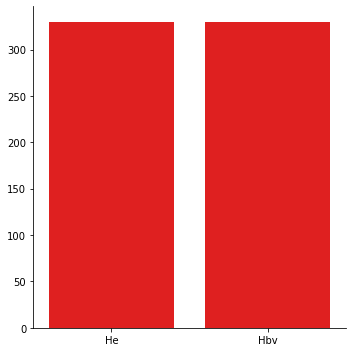

In [18]:
import seaborn as sns;
Diagnosis=['He','Hbv']
Count=[330,330]
sns.catplot(x=Diagnosis,y=Count,data=df,color="red",kind='bar')

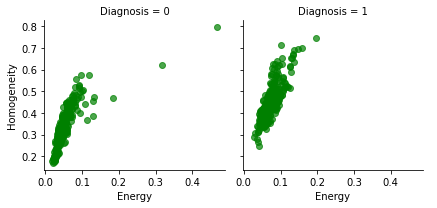

In [19]:
g=sns.FacetGrid(df,col="Diagnosis")
g.map(plt.scatter,"Energy","Homogeneity",color="green",alpha=.7)
g.add_legend();

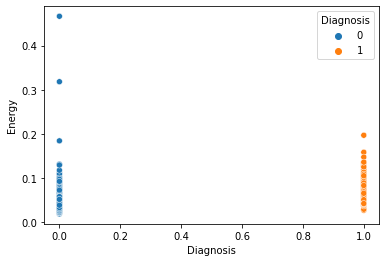

In [20]:
ax=sns.scatterplot(x="Diagnosis",y="Energy",hue="Diagnosis",data=df)    

# Selecting Dependent and Independent Varaible

In [21]:
x=df.iloc[:,0:4].values #independent values
y=df.iloc[:,-1].values #dependent variable

# Splitting the Dependent and Independent variable

In [22]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [23]:
x_train.shape

(528, 4)

In [24]:
y_train.shape

(528,)

In [25]:
x_test.shape

(132, 4)

In [26]:
x_test.shape

(132, 4)

# Feature scaling

In [27]:
# #Feature scaling 
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train=sc.fit_transform(x_train)
x_test=sc.fit_transform(x_test)
x_train

array([[-0.83089032,  0.84650133,  0.48366423,  0.36100963],
       [ 3.809457  , -2.00555778, -1.14720137, -2.49519371],
       [ 0.15470792, -0.14717972, -0.0055036 , -1.37231528],
       ...,
       [-0.07530273, -0.25090161, -0.23898082,  0.00502905],
       [ 0.02830666, -0.07673775,  0.16107054, -1.47604409],
       [ 0.14600199, -0.69521655, -0.88528596,  1.21268733]])

# Applying Machine learning Algorithm(SVM)

In [28]:
from sklearn.svm import SVC
classifier=SVC(kernel='linear')
classifier.fit(x_train,y_train)

SVC(kernel='linear')

In [29]:
y_pred=classifier.predict(x_test)

In [30]:
y_pred

array([0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1],
      dtype=int64)

In [31]:
y_test

array([0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1],
      dtype=int64)

# Finding Accuracy(SVM)

In [32]:
#confusion matrix
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[50 14]
 [ 5 63]]


In [35]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.91      0.78      0.84        64
           1       0.82      0.93      0.87        68

    accuracy                           0.86       132
   macro avg       0.86      0.85      0.85       132
weighted avg       0.86      0.86      0.86       132



# Applying Machine learning Algorithm(KNN)

In [36]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=7)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=7)

In [37]:
pred1=knn.predict(x_test)

# Finding Accuracy(KNN)

In [38]:
cm1=confusion_matrix(y_test,pred1)
print(cm1)

[[47 17]
 [ 9 59]]


In [40]:
from sklearn.metrics import classification_report
print(classification_report(y_test,pred1))

              precision    recall  f1-score   support

           0       0.84      0.73      0.78        64
           1       0.78      0.87      0.82        68

    accuracy                           0.80       132
   macro avg       0.81      0.80      0.80       132
weighted avg       0.81      0.80      0.80       132



# Applying Machine learning Algorithm(Random Forest)

In [41]:
#Model Implementation
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=10,criterion="entropy",random_state=0)
classifier.fit(x_train,y_train)
# Entropy : --- It is used to measure the impurity or randomness of a dataset.

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

In [42]:
y_pred2 = classifier.predict(x_test)

# Finding Accuracy(Random Forest)

In [43]:
from sklearn.metrics import confusion_matrix
b=confusion_matrix(y_test,y_pred2)
b

array([[52, 12],
       [11, 57]], dtype=int64)

In [45]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred2))

              precision    recall  f1-score   support

           0       0.83      0.81      0.82        64
           1       0.83      0.84      0.83        68

    accuracy                           0.83       132
   macro avg       0.83      0.83      0.83       132
weighted avg       0.83      0.83      0.83       132



# 2- Generating texture data by extracting features from all images using LBP

In [46]:
# Generating training data by extracting features from all images
dict={'tr' : [],'lbp_energy':[],'lbp_entropy':[]}
i=0
df1=pd.DataFrame(dict)
import glob
label = []
featLength = 2+5+2
trainFeats = np.zeros((len(data),featLength)) #Feature vector of each image is of size 1x1030
imgPath = glob.glob('training/*.png')
# data=os.listdir(imgPath)
for tr in imgPath:
    img=Image.open(tr)
    img_gray = img.convert('L') #Converting to grayscale
    img_arr = np.array(img_gray) #Converting to array
    # LBP
    # Energy and Entropy of LBP feature
    # Energy and Entropy of LBP feature
    feat_lbp = local_binary_pattern(img_arr,8,1,'uniform') #Radius = 1, No. of neighbours = 8
    feat_lbp = np.uint8((feat_lbp/feat_lbp.max())*255) #Converting to unit8
    lbp_hist,_ = np.histogram(feat_lbp,8)
    lbp_hist = np.array(lbp_hist,dtype=float)
    lbp_prob = np.divide(lbp_hist,np.sum(lbp_hist))
    lbp_energy = np.sum(lbp_prob**2)
    lbp_entropy = -np.sum(np.multiply(lbp_prob,np.log2(lbp_prob))) 
    print('LBP energy = '+str(lbp_energy))
    print('LBP entropy = '+str(lbp_entropy))
    print()
    print()
    print(tr)
    print()
    df1.loc[i] = [tr[9:],lbp_energy,lbp_entropy]
    i=i+1

LBP energy = 0.2770792609188581
LBP entropy = 2.239519093633127


training\cropped1.png

LBP energy = 0.26927106498465253
LBP entropy = 2.2268724303746668


training\cropped10.png

LBP energy = 0.26952824254444296
LBP entropy = 2.2431412735143668


training\cropped100.png

LBP energy = 0.17554822799500838
LBP entropy = 2.697098627274959


training\cropped1000.png

LBP energy = 0.15549731544855377
LBP entropy = 2.814792003929324


training\cropped1001.png

LBP energy = 0.26005979930828826
LBP entropy = 2.208365690724257


training\cropped1002.png

LBP energy = 0.16043725412897458
LBP entropy = 2.7994285594408965


training\cropped1003.png

LBP energy = 0.144837141267599
LBP entropy = 2.8897001909688207


training\cropped1004.png

LBP energy = 0.15824877191379827
LBP entropy = 2.7895622641759728


training\cropped1005.png

LBP energy = 0.18293179685274685
LBP entropy = 2.645809367435467


training\cropped1006.png

LBP energy = 0.18829479345846487
LBP entropy = 2.6202843531925284


traini

LBP energy = 0.18799275047959885
LBP entropy = 2.6409425360043772


training\cropped1098.png

LBP energy = 0.17715510244862498
LBP entropy = 2.7124022828551553


training\cropped1099.png

LBP energy = 0.3094995472869646
LBP entropy = 2.126202964464984


training\cropped11.png

LBP energy = 0.2774666320957191
LBP entropy = 2.1891963562934578


training\cropped110.png

LBP energy = 0.15577651867783981
LBP entropy = 2.8179361115172243


training\cropped1100.png

LBP energy = 0.16651228357269157
LBP entropy = 2.760082283779446


training\cropped1101.png

LBP energy = 0.1544959547099958
LBP entropy = 2.8314728266275035


training\cropped1102.png

LBP energy = 0.14486449076820299
LBP entropy = 2.872813217464057


training\cropped1103.png

LBP energy = 0.3554547420973326
LBP entropy = 1.9992292594596774


training\cropped1104.png

LBP energy = 0.14717920412395874
LBP entropy = 2.8472102631484892


training\cropped1105.png

LBP energy = 0.16340526114251663
LBP entropy = 2.7690482474429183


tr

LBP energy = 0.15946341586748256
LBP entropy = 2.8110656074954923


training\cropped1184.png

LBP energy = 0.19663532720770507
LBP entropy = 2.5992556017277892


training\cropped1185.png

LBP energy = 0.2428215416928866
LBP entropy = 2.317920889192811


training\cropped1186.png

LBP energy = 0.16900383653143908
LBP entropy = 2.735252930718923


training\cropped1187.png

LBP energy = 0.2501982190132056
LBP entropy = 2.2812783772843295


training\cropped1188.png

LBP energy = 0.1687011085033201
LBP entropy = 2.7487531763384796


training\cropped1189.png

LBP energy = 0.23291604459606108
LBP entropy = 2.391776715728774


training\cropped1190.png

LBP energy = 0.21773009504355068
LBP entropy = 2.5163265297715265


training\cropped1191.png

LBP energy = 0.2407882994800299
LBP entropy = 2.328222166850226


training\cropped1192.png

LBP energy = 0.20309734343614533
LBP entropy = 2.6472509302782035


training\cropped1193.png

LBP energy = 0.1925312684505223
LBP entropy = 2.630464171673445


tr

LBP energy = 0.1860052124919257
LBP entropy = 2.620965841221535


training\cropped1271.png

LBP energy = 0.16960623667018154
LBP entropy = 2.761665247210844


training\cropped1272.png

LBP energy = 0.16025303419693723
LBP entropy = 2.808550383770223


training\cropped1273.png

LBP energy = 0.2197363529283344
LBP entropy = 2.4703832447648684


training\cropped1274.png

LBP energy = 0.20646008273598715
LBP entropy = 2.5337023318346423


training\cropped1275.png

LBP energy = 0.2087283423018906
LBP entropy = 2.532265485602993


training\cropped1276.png

LBP energy = 0.1662278526103316
LBP entropy = 2.7293596324303193


training\cropped1277.png

LBP energy = 0.167668419805532
LBP entropy = 2.7250437321310006


training\cropped1278.png

LBP energy = 0.21420518070077396
LBP entropy = 2.4992863284001925


training\cropped1279.png

LBP energy = 0.21077749834925197
LBP entropy = 2.5131263251939937


training\cropped1280.png

LBP energy = 0.20845104181368665
LBP entropy = 2.532210560759281


tra

LBP energy = 0.2192197875539611
LBP entropy = 2.5036499072694762


training\cropped462.png

LBP energy = 0.2968601379885131
LBP entropy = 2.174022324237297


training\cropped463.png

LBP energy = 0.2005516680643966
LBP entropy = 2.5583654951746064


training\cropped464.png

LBP energy = 0.20235429421418433
LBP entropy = 2.6060344925528067


training\cropped465.png

LBP energy = 0.1899568789860804
LBP entropy = 2.656342463984899


training\cropped466.png

LBP energy = 0.18325338761667853
LBP entropy = 2.6839803139104412


training\cropped467.png

LBP energy = 0.1869365177633709
LBP entropy = 2.669656147736575


training\cropped468.png

LBP energy = 0.21034774793919925
LBP entropy = 2.576636526835656


training\cropped469.png

LBP energy = 0.25705469845344914
LBP entropy = 2.344228084998721


training\cropped47.png

LBP energy = 0.19204656918437205
LBP entropy = 2.6451111833379226


training\cropped470.png

LBP energy = 0.2581017057583701
LBP entropy = 2.2448030574776245


training\cropp

LBP energy = 0.23658666277866836
LBP entropy = 2.4312843942182547


training\cropped65.png

LBP energy = 0.2614272166796667
LBP entropy = 2.319901148345255


training\cropped66.png

LBP energy = 0.2616489725039595
LBP entropy = 2.3265686486107056


training\cropped67.png

LBP energy = 0.2531183499859856
LBP entropy = 2.3599073024436716


training\cropped68.png

LBP energy = 0.28702077555899486
LBP entropy = 2.2121147201880875


training\cropped69.png

LBP energy = 0.29319613135067585
LBP entropy = 2.0587377857257403


training\cropped7.png

LBP energy = 0.24354442954722041
LBP entropy = 2.390631965442518


training\cropped70.png

LBP energy = 0.2606498796790145
LBP entropy = 2.2469849184524957


training\cropped71.png

LBP energy = 0.2744234764192385
LBP entropy = 2.2626569805304015


training\cropped72.png

LBP energy = 0.26280222579576645
LBP entropy = 2.311177359950319


training\cropped73.png

LBP energy = 0.28304114453681567
LBP entropy = 2.213835008146072


training\cropped74.png

LBP energy = 0.26300239800152225
LBP entropy = 2.272659596674883


training\cropped95.png

LBP energy = 0.20919445620817856
LBP entropy = 2.5119174197066


training\cropped950.png

LBP energy = 0.28342622858045685
LBP entropy = 2.174631879144515


training\cropped951.png

LBP energy = 0.1912748443089317
LBP entropy = 2.590692953527771


training\cropped952.png

LBP energy = 0.2677039174584769
LBP entropy = 2.295095238456633


training\cropped953.png

LBP energy = 0.28254074285183656
LBP entropy = 2.194907998769472


training\cropped954.png

LBP energy = 0.2790025093214853
LBP entropy = 2.221711323703493


training\cropped955.png

LBP energy = 0.25412136361073606
LBP entropy = 2.3200761943330575


training\cropped956.png

LBP energy = 0.19533229551940706
LBP entropy = 2.573187744145119


training\cropped957.png

LBP energy = 0.25077346184741306
LBP entropy = 2.374324142429704


training\cropped958.png

LBP energy = 0.23554230777949817
LBP entropy = 2.4153324056054783


training\cropped9

In [54]:
a_list = []
for i in range(0,330):
     a_list.append("He")
for i in range(330,660):
     a_list.append("Hbv")
df1["Diagnosis"] =a_list
print(df1)

                  tr  lbp_energy  lbp_entropy Diagnosis
0       cropped1.png    0.277079     2.239519        He
1      cropped10.png    0.269271     2.226872        He
2     cropped100.png    0.269528     2.243141        He
3    cropped1000.png    0.175548     2.697099        He
4    cropped1001.png    0.155497     2.814792        He
..               ...         ...          ...       ...
655   cropped995.png    0.173003     2.722765       Hbv
656   cropped996.png    0.159396     2.787318       Hbv
657   cropped997.png    0.173723     2.706483       Hbv
658   cropped998.png    0.157747     2.803530       Hbv
659   cropped999.png    0.150286     2.842336       Hbv

[660 rows x 4 columns]


# Visualization of Dataframe

In [55]:
df1.head(5)

,tr,lbp_energy,lbp_entropy,Diagnosis
0,cropped1.png,0.277079,2.239519,He
1,cropped10.png,0.269271,2.226872,He
2,cropped100.png,0.269528,2.243141,He
3,cropped1000.png,0.175548,2.697099,He
4,cropped1001.png,0.155497,2.814792,He


In [56]:
df1.tail(5)

,tr,lbp_energy,lbp_entropy,Diagnosis
655,cropped995.png,0.173003,2.722765,Hbv
656,cropped996.png,0.159396,2.787318,Hbv
657,cropped997.png,0.173723,2.706483,Hbv
658,cropped998.png,0.157747,2.803530,Hbv
659,cropped999.png,0.150286,2.842336,Hbv


In [57]:
#converting a dataframe into csv_file
df1.to_csv("modelLBP.csv")

In [58]:
df1.shape
#size of dataframe

(660, 4)

In [59]:
df1.dtypes
#finding type of data

tr              object
lbp_energy     float64
lbp_entropy    float64
Diagnosis       object
dtype: object

In [60]:
df1.isnull().sum()

tr             0
lbp_energy     0
lbp_entropy    0
Diagnosis      0
dtype: int64

# Replacing target values with integer 0 and 1

In [61]:
df1=df1.replace(to_replace='He',value=0,regex=True)
df1=df1.replace(to_replace='Hbv',value=1,regex=True)
df1.tail(5)

,tr,lbp_energy,lbp_entropy,Diagnosis
655,cropped995.png,0.173003,2.722765,1
656,cropped996.png,0.159396,2.787318,1
657,cropped997.png,0.173723,2.706483,1
658,cropped998.png,0.157747,2.803530,1
659,cropped999.png,0.150286,2.842336,1


# Deleting irrelevant column from dataframe

In [62]:
df1=df1.drop("tr",axis=1)
df1.tail(5)
#deleting thr tr column as it is not required

,lbp_energy,lbp_entropy,Diagnosis
655,0.173003,2.722765,1
656,0.159396,2.787318,1
657,0.173723,2.706483,1
658,0.157747,2.803530,1
659,0.150286,2.842336,1


# finding number of diagnosis values

In [63]:
df1.groupby('Diagnosis')['Diagnosis'].count()
#finding the no of diagnosis's values

Diagnosis
0    330
1    330
Name: Diagnosis, dtype: int64

# Plotting of dataframe

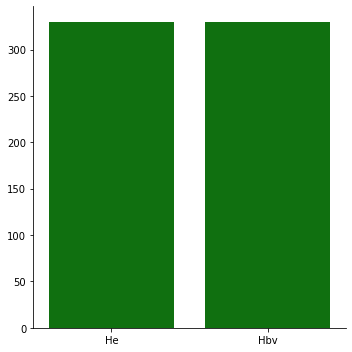

In [64]:
Diagnosis=['He','Hbv']
Count=[330,330]
sns.catplot(x=Diagnosis,y=Count,data=df,color="green",kind='bar')

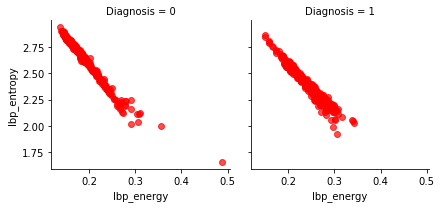

In [65]:
g=sns.FacetGrid(df1,col="Diagnosis")
g.map(plt.scatter,"lbp_energy","lbp_entropy",color="red",alpha=.7)
g.add_legend();

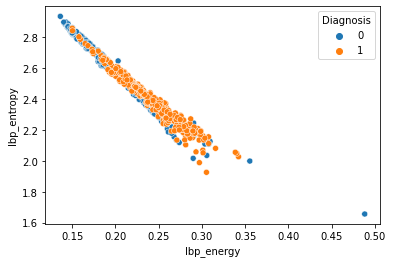

In [66]:
ax=sns.scatterplot(x="lbp_energy",y="lbp_entropy",hue="Diagnosis",data=df1)    

# Selecting dependent and independent variables

In [67]:
x_lbp=df1.iloc[:,0:2].values #independent values
y_lbp=df1.iloc[:,-1].values #dependent variable

# Splitting the dependent and independent variables

In [68]:
from sklearn.model_selection import train_test_split
x_lbp_train,x_lbp_test,y_lbp_train,y_lbp_test=train_test_split(x_lbp,y_lbp,test_size=0.2)

In [69]:
x_lbp_train.shape

(528, 2)

In [70]:
x_lbp_test.shape

(132, 2)

# Feature Scalling

In [71]:
# #Feature scaling 
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_lbp_train=sc.fit_transform(x_lbp_train)
x_lbp_test=sc.fit_transform(x_lbp_test)
x_lbp_train

array([[ 1.26284307, -1.04303191],
       [ 1.36003374, -1.26657416],
       [ 0.96620197, -1.40317467],
       ...,
       [ 1.28252015, -1.59305063],
       [-0.33228803,  0.2954219 ],
       [ 0.270425  , -0.47234191]])

# Applaying Machine learning algorithm (SVM)

In [72]:
from sklearn.svm import SVC
classifier=SVC(kernel='linear')
classifier.fit(x_lbp_train,y_lbp_train)

SVC(kernel='linear')

In [73]:
y_lbp_pred=classifier.predict(x_lbp_test)

In [74]:
y_lbp_pred

array([0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1,
       0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1],
      dtype=int64)

In [75]:
y_lbp_test

array([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
      dtype=int64)

# Finding accuracy(SVM)

In [76]:
from sklearn.metrics import confusion_matrix
b_lbp=confusion_matrix(y_lbp_test,y_lbp_pred)
b_lbp

array([[54, 19],
       [ 9, 50]], dtype=int64)

In [79]:
from sklearn.metrics import classification_report
print(classification_report(y_lbp_test,y_lbp_pred))

              precision    recall  f1-score   support

           0       0.86      0.74      0.79        73
           1       0.72      0.85      0.78        59

    accuracy                           0.79       132
   macro avg       0.79      0.79      0.79       132
weighted avg       0.80      0.79      0.79       132



# Applying machine learning algorithm(KNN)

In [80]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=7)
knn.fit(x_lbp_train,y_lbp_train)

KNeighborsClassifier(n_neighbors=7)

In [81]:
pred_knn=knn.predict(x_lbp_test)

# Finding accuracy(KNN)

In [82]:
b_lbp1=confusion_matrix(y_lbp_test,pred_knn)
b_lbp1

array([[53, 20],
       [ 8, 51]], dtype=int64)

In [85]:
from sklearn.metrics import classification_report
print(classification_report(y_lbp_test,pred_knn))

              precision    recall  f1-score   support

           0       0.87      0.73      0.79        73
           1       0.72      0.86      0.78        59

    accuracy                           0.79       132
   macro avg       0.79      0.80      0.79       132
weighted avg       0.80      0.79      0.79       132



# Applying Machine learning algorithm(Random Forest) 

In [86]:
#Model Implementation
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=10,criterion="entropy",random_state=0)
classifier.fit(x_lbp_train,y_lbp_train)
# Entropy : --- It is used to measure the impurity or randomness of a dataset.

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

In [87]:
y_lbp_pred2 = classifier.predict(x_lbp_test)

# Finding Accuracy

In [88]:
b_RF=confusion_matrix(y_lbp_test,y_lbp_pred2)
b_RF

array([[51, 22],
       [14, 45]], dtype=int64)

In [90]:
from sklearn.metrics import classification_report
print(classification_report(y_lbp_test,y_lbp_pred2))

              precision    recall  f1-score   support

           0       0.78      0.70      0.74        73
           1       0.67      0.76      0.71        59

    accuracy                           0.73       132
   macro avg       0.73      0.73      0.73       132
weighted avg       0.73      0.73      0.73       132



# 3- Using hybrid texture features(GLCM+LBP)

In [132]:
# Generating training data by extracting features from all images
d_new={'tr' : [],'Contrast':[],'Dissimilarity':[],'Homogeneity':[],'Energy':[],'Correlation':[],'lbp_energy':[],'lbp_entropy':[]}
i=0
df2=pd.DataFrame(d_new)
import glob
label = []
featLength = 2+5+2
trainFeats = np.zeros((len(data),featLength)) #Feature vector of each image is of size 1x1030
imgPath = glob.glob('training/*.png')
# data=os.listdir(imgPath)
for tr in imgPath:
#     imgPath = 'Desktop/data/training'
#     data=os.listdir(imgPath)
    img=Image.open(tr)
    img_gray = img.convert('L') #Converting to grayscale
    img_arr = np.array(img_gray) #Converting to array
    # LBP
    # Finding LBP
    feat_lbp = local_binary_pattern(img_arr,8,1,'uniform') #Radius = 1, No. of neighbours = 8
    feat_lbp = np.uint8((feat_lbp/feat_lbp.max())*255) #Converting to unit8
    lbp_hist,_ = np.histogram(feat_lbp,8)
    lbp_hist = np.array(lbp_hist,dtype=float)
    lbp_prob = np.divide(lbp_hist,np.sum(lbp_hist))
    lbp_energy = np.sum(lbp_prob**2)
    lbp_entropy = -np.sum(np.multiply(lbp_prob,np.log2(lbp_prob))) 
    # GLCM
    gCoMat = greycomatrix(img_arr, [2], [0],256,symmetric=True, normed=True)
    contrast = greycoprops(gCoMat, prop='contrast')
    dissimilarity = greycoprops(gCoMat, prop='dissimilarity')
    homogeneity = greycoprops(gCoMat, prop='homogeneity')    
    energy = greycoprops(gCoMat, prop='energy')
    correlation = greycoprops(gCoMat, prop='correlation')    
    feat_glcm = np.array([contrast[0][0],dissimilarity[0][0],homogeneity[0][0],energy[0][0],correlation[0][0]])
    print()
    print()
    print(tr)
    print()
    print('Contrast = '+str(contrast[0][0]))
    print('Dissimilarity = '+str(dissimilarity[0][0]))
    print('Homogeneity = '+str(homogeneity[0][0]))
    print('Energy = '+str(energy[0][0]))
    print('Correlation = '+str(correlation[0][0]))
    print('LBP energy = '+str(lbp_energy))
    print('LBP entropy = '+str(lbp_entropy))
    df2.loc[i] = [tr[9:],contrast[0][0],dissimilarity[0][0],homogeneity[0][0],energy[0][0],correlation[0][0],lbp_energy,lbp_entropy]
    i=i+1




training\cropped1.png

Contrast = 4.678167816781679
Dissimilarity = 1.5518551855185518
Homogeneity = 0.4749003539372016
Energy = 0.09760958165472208
Correlation = 0.9257950734317185
LBP energy = 0.2770792609188581
LBP entropy = 2.239519093633127


training\cropped10.png

Contrast = 5.975197519751975
Dissimilarity = 1.8327832783278328
Homogeneity = 0.4150912077006795
Energy = 0.08677428121210926
Correlation = 0.9290416087376694
LBP energy = 0.26927106498465253
LBP entropy = 2.2268724303746668


training\cropped100.png

Contrast = 4.851885188518852
Dissimilarity = 1.6755675567556758
Homogeneity = 0.43091353612491384
Energy = 0.08074325872524081
Correlation = 0.9547517105379284
LBP energy = 0.26952824254444296
LBP entropy = 2.2431412735143668


training\cropped1000.png

Contrast = 10.82888288828883
Dissimilarity = 2.1112111211121114
Homogeneity = 0.44358444644509143
Energy = 0.057089638401116936
Correlation = 0.9701976886755075
LBP energy = 0.17554822799500838
LBP entropy = 2.6970986272



training\cropped1030.png

Contrast = 47.78987898789878
Dissimilarity = 4.962996299629962
Homogeneity = 0.21630376281738234
Energy = 0.03786590486191944
Correlation = 0.9120506384083963
LBP energy = 0.14799751732649963
LBP entropy = 2.8511162963392565


training\cropped1031.png

Contrast = 19.371937193719372
Dissimilarity = 2.9238923892389237
Homogeneity = 0.3379201137697735
Energy = 0.052177863876077174
Correlation = 0.9452352699159452
LBP energy = 0.15789573019231395
LBP entropy = 2.7927066300707692


training\cropped1032.png

Contrast = 25.661466146614654
Dissimilarity = 3.4634463446344634
Homogeneity = 0.2919808715113066
Energy = 0.045176854352913534
Correlation = 0.9490617037039888
LBP energy = 0.16392997563021117
LBP entropy = 2.771299718379947


training\cropped1033.png

Contrast = 12.002900290029007
Dissimilarity = 2.1215121512151223
Homogeneity = 0.4488709351367207
Energy = 0.08017287866740137
Correlation = 0.942126218456866
LBP energy = 0.16780630126535837
LBP entropy = 2.74



training\cropped1061.png

Contrast = 43.921792179217924
Dissimilarity = 4.571257125712572
Homogeneity = 0.24475762602685483
Energy = 0.033916221052867915
Correlation = 0.9473129125632761
LBP energy = 0.1464187803773695
LBP entropy = 2.866444821588532


training\cropped1062.png

Contrast = 11.858585858585856
Dissimilarity = 2.6058605860586055
Homogeneity = 0.3248688222091185
Energy = 0.04589156988137225
Correlation = 0.9611645644216389
LBP energy = 0.1668188363025816
LBP entropy = 2.757387660300737


training\cropped1063.png

Contrast = 22.249124912491244
Dissimilarity = 3.473447344734473
Homogeneity = 0.27065136002470724
Energy = 0.03543086305268149
Correlation = 0.9621857703464524
LBP energy = 0.14733007803804254
LBP entropy = 2.8465338916837784


training\cropped1064.png

Contrast = 23.654465446544652
Dissimilarity = 3.531253125312531
Homogeneity = 0.27013728942148385
Energy = 0.03549143440024279
Correlation = 0.9529305377239491
LBP energy = 0.15731906510719673
LBP entropy = 2.7936



training\cropped1092.png

Contrast = 47.79087908790878
Dissimilarity = 4.721572157215721
Homogeneity = 0.2558189684352121
Energy = 0.03522368704747931
Correlation = 0.9464594139778763
LBP energy = 0.19264160821367585
LBP entropy = 2.593213697660185


training\cropped1093.png

Contrast = 47.270127012701266
Dissimilarity = 4.8580858085808565
Homogeneity = 0.2248493995688935
Energy = 0.032999966494948976
Correlation = 0.9008036880401625
LBP energy = 0.19328127517017735
LBP entropy = 2.5965183080066563


training\cropped1094.png

Contrast = 47.35933593359335
Dissimilarity = 5.217121712171216
Homogeneity = 0.19465062627831053
Energy = 0.028317492262818877
Correlation = 0.9388421815288759
LBP energy = 0.1502194960790128
LBP entropy = 2.8618531914520844


training\cropped1095.png

Contrast = 14.565356535653565
Dissimilarity = 2.777977797779778
Homogeneity = 0.32216688193067194
Energy = 0.05261281777321684
Correlation = 0.938824882147007
LBP energy = 0.14623713587265535
LBP entropy = 2.85586



training\cropped1125.png

Contrast = 36.265826582658256
Dissimilarity = 3.9821982198219814
Homogeneity = 0.26820394004209563
Energy = 0.03496998095058876
Correlation = 0.9834267931939951
LBP energy = 0.14268569847237086
LBP entropy = 2.8804040699021596


training\cropped1126.png

Contrast = 4.620662066206622
Dissimilarity = 1.4867486748674867
Homogeneity = 0.48244537201784854
Energy = 0.0844930336960267
Correlation = 0.9590735496283995
LBP energy = 0.1883685130138985
LBP entropy = 2.610006602243894


training\cropped1127.png

Contrast = 1.9765976597659765
Dissimilarity = 1.0351035103510353
Homogeneity = 0.5728641872380952
Energy = 0.11795686764825036
Correlation = 0.9790243939801685
LBP energy = 0.2148155185371619
LBP entropy = 2.471604502387835


training\cropped1128.png

Contrast = 19.02710271027103
Dissimilarity = 3.0205020502050206
Homogeneity = 0.31111528079014467
Energy = 0.04783103112655685
Correlation = 0.9669917200747663
LBP energy = 0.1709756144414627
LBP entropy = 2.731585



training\cropped1161.png

Contrast = 81.92439243924392
Dissimilarity = 5.560756075607559
Homogeneity = 0.23303068723711126
Energy = 0.027882440322205645
Correlation = 0.9870073097951341
LBP energy = 0.18341558187922033
LBP entropy = 2.6761141233424373


training\cropped1162.png

Contrast = 15.222822282228226
Dissimilarity = 2.858185818581858
Homogeneity = 0.31839547039404853
Energy = 0.034381628923896665
Correlation = 0.9904007604027454
LBP energy = 0.27054586307042966
LBP entropy = 2.135351007057071


training\cropped1163.png

Contrast = 15.523052305230518
Dissimilarity = 2.8139813981398136
Homogeneity = 0.3259719857537654
Energy = 0.0359148014291268
Correlation = 0.9885374878319879
LBP energy = 0.21660311495436196
LBP entropy = 2.4899639428156917


training\cropped1164.png

Contrast = 15.03290329032903
Dissimilarity = 2.95089508950895
Homogeneity = 0.289760020977418
Energy = 0.031960824279777034
Correlation = 0.990617587057058
LBP energy = 0.14984840390918733
LBP entropy = 2.826573



training\cropped1199.png

Contrast = 12.887188718871887
Dissimilarity = 2.648764876487649
Homogeneity = 0.3233046221571117
Energy = 0.035146792841686716
Correlation = 0.9900768910385445
LBP energy = 0.20210015335228237
LBP entropy = 2.5709758263611193


training\cropped12.png

Contrast = 7.585958595859586
Dissimilarity = 2.0784078407840783
Homogeneity = 0.383216985920096
Energy = 0.06521173568897402
Correlation = 0.9372579177616162
LBP energy = 0.2654513218721885
LBP entropy = 2.2198847531735533


training\cropped1200.png

Contrast = 26.957295729572955
Dissimilarity = 3.5087508750875083
Homogeneity = 0.2830858140898831
Energy = 0.03335344778836738
Correlation = 0.9837629110515896
LBP energy = 0.20318679148660979
LBP entropy = 2.562917962376968


training\cropped1201.png

Contrast = 25.679467946794674
Dissimilarity = 3.6394639463946383
Homogeneity = 0.26094091028227095
Energy = 0.028120511103486588
Correlation = 0.991193877461491
LBP energy = 0.23783355399524164
LBP entropy = 2.352908

training\cropped1231.png

Contrast = 42.87498749874986
Dissimilarity = 4.954595459545954
Homogeneity = 0.19401728260444337
Energy = 0.02520589337950236
Correlation = 0.9628115104543382
LBP energy = 0.1833988608212263
LBP entropy = 2.6931942652355882


training\cropped1232.png

Contrast = 44.21702170217022
Dissimilarity = 4.9828982898289835
Homogeneity = 0.19906923510878902
Energy = 0.02570704502318855
Correlation = 0.9595587331085933
LBP energy = 0.1833534064509323
LBP entropy = 2.693867352703486


training\cropped1233.png

Contrast = 19.054505450545058
Dissimilarity = 2.8234823482348235
Homogeneity = 0.31784543091627043
Energy = 0.03761320162442648
Correlation = 0.9886168515474494
LBP energy = 0.1617245257396231
LBP entropy = 2.781929752119284


training\cropped1234.png

Contrast = 43.33623362336233
Dissimilarity = 4.958795879587957
Homogeneity = 0.20242497342216714
Energy = 0.02493620573890877
Correlation = 0.9640452614004735
LBP energy = 0.18523291102827866
LBP entropy = 2.686193498



training\cropped1266.png

Contrast = 42.56225622562255
Dissimilarity = 4.7104710471047095
Homogeneity = 0.21327558441384953
Energy = 0.030212043035538004
Correlation = 0.9340339052690515
LBP energy = 0.14850952765404007
LBP entropy = 2.8483413365902903


training\cropped1267.png

Contrast = 21.82758275827582
Dissimilarity = 3.254325432543254
Homogeneity = 0.3027458855493078
Energy = 0.04115943151720605
Correlation = 0.9487305763878298
LBP energy = 0.22817933403889148
LBP entropy = 2.4343660643150646


training\cropped1268.png

Contrast = 75.89948994899488
Dissimilarity = 6.07070707070707
Homogeneity = 0.18483522044671374
Energy = 0.022223158389731084
Correlation = 0.9586488464739392
LBP energy = 0.16144015243608373
LBP entropy = 2.8037198483926598


training\cropped1269.png

Contrast = 43.57205720572057
Dissimilarity = 4.859385938593858
Homogeneity = 0.20312666793677311
Energy = 0.026372980488838033
Correlation = 0.958491396315182
LBP energy = 0.16590773083797744
LBP entropy = 2.7795



training\cropped1300.png

Contrast = 10.314931493149313
Dissimilarity = 2.216521652165216
Homogeneity = 0.3901058919016373
Energy = 0.06547413481365977
Correlation = 0.9558836847146458
LBP energy = 0.17015203506663407
LBP entropy = 2.733953231731652


training\cropped1301.png

Contrast = 7.187118711871189
Dissimilarity = 1.962596259625963
Homogeneity = 0.4097779604355357
Energy = 0.06341675091521551
Correlation = 0.9592651256452995
LBP energy = 0.18297775923427395
LBP entropy = 2.6641172427478264


training\cropped1302.png

Contrast = 10.419541954195417
Dissimilarity = 2.224122412241224
Homogeneity = 0.38896928956337945
Energy = 0.06645587432637284
Correlation = 0.9563528734443928
LBP energy = 0.16868669379815285
LBP entropy = 2.7427584516272403


training\cropped1303.png

Contrast = 7.8838883888388835
Dissimilarity = 2.0251025102510254
Homogeneity = 0.3980500171395508
Energy = 0.05563374867692478
Correlation = 0.9744606080468676
LBP energy = 0.16298000812047614
LBP entropy = 2.76422



training\cropped27.png

Contrast = 6.034603460346035
Dissimilarity = 1.8833883388338835
Homogeneity = 0.39773921405021107
Energy = 0.06808106902834067
Correlation = 0.9482291899333259
LBP energy = 0.21818465796609793
LBP entropy = 2.5112800859559608


training\cropped28.png

Contrast = 4.72877287728773
Dissimilarity = 1.6026602660266027
Homogeneity = 0.4573650978296063
Energy = 0.09368105539684453
Correlation = 0.9435480422567741
LBP energy = 0.27766292194088316
LBP entropy = 2.213418397411972


training\cropped29.png

Contrast = 4.636563656365636
Dissimilarity = 1.620662066206621
Homogeneity = 0.44617220775951943
Energy = 0.07746286232126237
Correlation = 0.960967502133479
LBP energy = 0.2569992306679656
LBP entropy = 2.2991335788734797


training\cropped3.png

Contrast = 5.51995199519952
Dissimilarity = 1.6875687568756876
Homogeneity = 0.4471575602899302
Energy = 0.08865913382047863
Correlation = 0.9238147062822961
LBP energy = 0.26265150563853773
LBP entropy = 2.2960187336664837





training\cropped469.png

Contrast = 6.82148214821482
Dissimilarity = 1.8645864586458643
Homogeneity = 0.42141306130819656
Energy = 0.07957387345697942
Correlation = 0.9311278779675426
LBP energy = 0.21034774793919925
LBP entropy = 2.576636526835656


training\cropped47.png

Contrast = 4.193319331933194
Dissimilarity = 1.561856185618562
Homogeneity = 0.4505018793369149
Energy = 0.07041428537402926
Correlation = 0.9710774044417444
LBP energy = 0.25705469845344914
LBP entropy = 2.344228084998721


training\cropped470.png

Contrast = 8.316731673167316
Dissimilarity = 2.197719771977198
Homogeneity = 0.3656389177028489
Energy = 0.05962168995957149
Correlation = 0.9561005291865158
LBP energy = 0.19204656918437205
LBP entropy = 2.6451111833379226


training\cropped471.png

Contrast = 25.693769376937695
Dissimilarity = 2.621062106210621
Homogeneity = 0.3841967594650091
Energy = 0.07150494766363025
Correlation = 0.8596601393232537
LBP energy = 0.2581017057583701
LBP entropy = 2.244803057477624

Energy = 0.04859812066169427
Correlation = 0.9873619609945224
LBP energy = 0.22875511502209178
LBP entropy = 2.429430666356156


training\cropped501.png

Contrast = 5.943627450980393
Dissimilarity = 1.8289215686274511
Homogeneity = 0.41659525771951444
Energy = 0.04939590859814265
Correlation = 0.9889088827981141
LBP energy = 0.24629852091608212
LBP entropy = 2.364661657439388


training\cropped502.png

Contrast = 5.850490196078431
Dissimilarity = 1.8224509803921567
Homogeneity = 0.4164541382943903
Energy = 0.051833825659570294
Correlation = 0.9866484971960368
LBP energy = 0.247684362962756
LBP entropy = 2.366158160268999


training\cropped503.png

Contrast = 5.696969696969697
Dissimilarity = 1.8107810781078109
Homogeneity = 0.41421507731468343
Energy = 0.05406773191741764
Correlation = 0.9845148703454447
LBP energy = 0.21563750268461873
LBP entropy = 2.534668965259348


training\cropped504.png

Contrast = 5.704270427042704
Dissimilarity = 1.8022802280228023
Homogeneity = 0.418744803947

LBP entropy = 2.5620671907583707


training\cropped531.png

Contrast = 8.875587558755877
Dissimilarity = 2.1571157115711577
Homogeneity = 0.38633111721655633
Energy = 0.05662438725658075
Correlation = 0.9671831367515572
LBP energy = 0.28129715740764827
LBP entropy = 2.104281141080203


training\cropped532.png

Contrast = 12.72367236723672
Dissimilarity = 2.739473947394739
Homogeneity = 0.305926151570533
Energy = 0.02963023086877254
Correlation = 0.9940417740635044
LBP energy = 0.25521449797219214
LBP entropy = 2.241522466371233


training\cropped533.png

Contrast = 10.427942794279428
Dissimilarity = 2.44014401440144
Homogeneity = 0.34131259591429214
Energy = 0.03710910135411269
Correlation = 0.9877618424124195
LBP energy = 0.24944994205817062
LBP entropy = 2.2869123409555545


training\cropped534.png

Contrast = 19.165916591659165
Dissimilarity = 2.6972697269726966
Homogeneity = 0.33662394214612196
Energy = 0.0395462737298232
Correlation = 0.9762533512714259
LBP energy = 0.258925746403

LBP entropy = 2.319901148345255


training\cropped67.png

Contrast = 3.9784978497849783
Dissimilarity = 1.449044904490449
Homogeneity = 0.49088146577329356
Energy = 0.0807166833525911
Correlation = 0.9708004011651227
LBP energy = 0.2616489725039595
LBP entropy = 2.3265686486107056


training\cropped68.png

Contrast = 4.643764376437645
Dissimilarity = 1.6020602060206022
Homogeneity = 0.4508479044488766
Energy = 0.08333461983069147
Correlation = 0.9402860950267325
LBP energy = 0.2531183499859856
LBP entropy = 2.3599073024436716


training\cropped69.png

Contrast = 3.355535553555356
Dissimilarity = 1.325932593259326
Homogeneity = 0.5125239653589013
Energy = 0.07577788859724958
Correlation = 0.9847552424582305
LBP energy = 0.28702077555899486
LBP entropy = 2.2121147201880875


training\cropped7.png

Contrast = 5.029502950295029
Dissimilarity = 1.7045704570457048
Homogeneity = 0.4268839738272109
Energy = 0.057393412233578904
Correlation = 0.9860846020829159
LBP energy = 0.29319613135067585




training\cropped89.png

Contrast = 2.9764646464646463
Dissimilarity = 1.2833333333333334
Homogeneity = 0.5134910573203256
Energy = 0.08615809316989069
Correlation = 0.9771055654085405
LBP energy = 0.29319196157239485
LBP entropy = 2.19839320410457


training\cropped890.png

Contrast = 5.856285628562857
Dissimilarity = 1.8372837283728372
Homogeneity = 0.40853293343901576
Energy = 0.043056309068609966
Correlation = 0.9927908355202771
LBP energy = 0.22550031303454232
LBP entropy = 2.4789538308436896


training\cropped891.png

Contrast = 7.004200420042005
Dissimilarity = 2.0171017101710174
Homogeneity = 0.3821876749406688
Energy = 0.06310563702603499
Correlation = 0.950032084117615
LBP energy = 0.23441761482352927
LBP entropy = 2.4209312085496206


training\cropped892.png

Contrast = 3.02990299029903
Dissimilarity = 1.2943294329432944
Homogeneity = 0.5085840231207222
Energy = 0.08051016278982191
Correlation = 0.9778915125918218
LBP energy = 0.2516709406107324
LBP entropy = 2.395663609656



training\cropped934.png

Contrast = 2.0565056505650565
Dissimilarity = 1.0834083408340833
Homogeneity = 0.553281346234171
Energy = 0.08259469903476183
Correlation = 0.9950223516046733
LBP energy = 0.21027500172712194
LBP entropy = 2.496499004390918


training\cropped935.png

Contrast = 2.2709270927092713
Dissimilarity = 1.165016501650165
Homogeneity = 0.5252633408137194
Energy = 0.07926491356505241
Correlation = 0.9941301094772548
LBP energy = 0.20483740976550727
LBP entropy = 2.524733157297131


training\cropped936.png

Contrast = 0.9865986598659866
Dissimilarity = 0.6771677167716771
Homogeneity = 0.6922001249898746
Energy = 0.1361951711311258
Correlation = 0.9869959851944914
LBP energy = 0.29005706983581586
LBP entropy = 2.176024474577282


training\cropped937.png

Contrast = 1.525952595259526
Dissimilarity = 0.9148914891489148
Homogeneity = 0.6024835967759672
Energy = 0.08095542409622912
Correlation = 0.9956873950865388
LBP energy = 0.21898104159717777
LBP entropy = 2.451730667663

Homogeneity = 0.34638533628820617
Energy = 0.052425419954896336
Correlation = 0.9700348311801463
LBP energy = 0.21123598207160474
LBP entropy = 2.5314074532654374


training\cropped968.png

Contrast = 5.488048804880488
Dissimilarity = 1.7494749474947493
Homogeneity = 0.43011691569305277
Energy = 0.07586346944113792
Correlation = 0.9529702566210678
LBP energy = 0.2734921711477933
LBP entropy = 2.21755979016103


training\cropped969.png

Contrast = 7.322832283228323
Dissimilarity = 2.086908690869087
Homogeneity = 0.3692654676987225
Energy = 0.05384732934863388
Correlation = 0.978628993182126
LBP energy = 0.20628001423903797
LBP entropy = 2.5780415409794584


training\cropped97.png

Contrast = 3.0962096209620964
Dissimilarity = 1.2626262626262625
Homogeneity = 0.5287775728743805
Energy = 0.10189887915222955
Correlation = 0.9732371490458438
LBP energy = 0.2787808495952269
LBP entropy = 2.264884581321445


training\cropped970.png

Contrast = 6.245224522452245
Dissimilarity = 1.8689868986898



training\cropped999.png

Contrast = 18.82798279827983
Dissimilarity = 2.975397539753976
Homogeneity = 0.3193074114296462
Energy = 0.042500602844964736
Correlation = 0.956718693059552
LBP energy = 0.1502856691855339
LBP entropy = 2.842336253335426


In [133]:
df2.head(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,lbp_energy,lbp_entropy
0,cropped1.png,4.678168,1.551855,0.474900,0.097610,0.925795,0.277079,2.239519
1,cropped10.png,5.975198,1.832783,0.415091,0.086774,0.929042,0.269271,2.226872
2,cropped100.png,4.851885,1.675568,0.430914,0.080743,0.954752,0.269528,2.243141
3,cropped1000.png,10.828883,2.111211,0.443584,0.057090,0.970198,0.175548,2.697099
4,cropped1001.png,19.853385,3.015702,0.337853,0.050298,0.956297,0.155497,2.814792


In [134]:
new_list = []
for i in range(0,330):
     new_list.append("He")
for i in range(330,660):
     new_list.append("Hbv")
df2["Diagnosis"] =new_list
print(df2)

                  tr   Contrast  Dissimilarity  Homogeneity    Energy  \
0       cropped1.png   4.678168       1.551855     0.474900  0.097610   
1      cropped10.png   5.975198       1.832783     0.415091  0.086774   
2     cropped100.png   4.851885       1.675568     0.430914  0.080743   
3    cropped1000.png  10.828883       2.111211     0.443584  0.057090   
4    cropped1001.png  19.853385       3.015702     0.337853  0.050298   
..               ...        ...            ...          ...       ...   
655   cropped995.png  15.208521       2.681068     0.354965  0.042802   
656   cropped996.png  14.974597       2.612361     0.372797  0.062242   
657   cropped997.png  11.678968       2.141214     0.441131  0.065726   
658   cropped998.png  17.993199       2.882088     0.333618  0.051190   
659   cropped999.png  18.827983       2.975398     0.319307  0.042501   

     Correlation  lbp_energy  lbp_entropy Diagnosis  
0       0.925795    0.277079     2.239519        He  
1       0.92904

# Visualization of dataframe

In [135]:
df2.head(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,lbp_energy,lbp_entropy,Diagnosis
0,cropped1.png,4.678168,1.551855,0.474900,0.097610,0.925795,0.277079,2.239519,He
1,cropped10.png,5.975198,1.832783,0.415091,0.086774,0.929042,0.269271,2.226872,He
2,cropped100.png,4.851885,1.675568,0.430914,0.080743,0.954752,0.269528,2.243141,He
3,cropped1000.png,10.828883,2.111211,0.443584,0.057090,0.970198,0.175548,2.697099,He
4,cropped1001.png,19.853385,3.015702,0.337853,0.050298,0.956297,0.155497,2.814792,He


In [136]:
df2.tail(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,lbp_energy,lbp_entropy,Diagnosis
655,cropped995.png,15.208521,2.681068,0.354965,0.042802,0.976182,0.173003,2.722765,Hbv
656,cropped996.png,14.974597,2.612361,0.372797,0.062242,0.928800,0.159396,2.787318,Hbv
657,cropped997.png,11.678968,2.141214,0.441131,0.065726,0.959901,0.173723,2.706483,Hbv
658,cropped998.png,17.993199,2.882088,0.333618,0.051190,0.929932,0.157747,2.803530,Hbv
659,cropped999.png,18.827983,2.975398,0.319307,0.042501,0.956719,0.150286,2.842336,Hbv


In [137]:
df2.isnull().sum()

tr               0
Contrast         0
Dissimilarity    0
Homogeneity      0
Energy           0
Correlation      0
lbp_energy       0
lbp_entropy      0
Diagnosis        0
dtype: int64

In [138]:
df2.shape

(660, 9)

In [139]:
df2.dtypes

tr                object
Contrast         float64
Dissimilarity    float64
Homogeneity      float64
Energy           float64
Correlation      float64
lbp_energy       float64
lbp_entropy      float64
Diagnosis         object
dtype: object

In [140]:
df2.to_csv("modelcombination.csv")

# replacing target values with integer o and 1

In [101]:
df2=df2.replace(to_replace='He',value=0,regex=True)
df2=df2.replace(to_replace='Hbv',value=1,regex=True)
df2.head(5)

,tr,Contrast,Dissimilarity,Homogeneity,Energy,Correlation,lbp_energy,lbp_entropy,Diagnosis
0,cropped1.png,4.678168,1.551855,0.474900,0.097610,0.925795,0.277079,2.239519,0
1,cropped10.png,5.975198,1.832783,0.415091,0.086774,0.929042,0.269271,2.226872,0
2,cropped100.png,4.851885,1.675568,0.430914,0.080743,0.954752,0.269528,2.243141,0
3,cropped1000.png,10.828883,2.111211,0.443584,0.057090,0.970198,0.175548,2.697099,0
4,cropped1001.png,19.853385,3.015702,0.337853,0.050298,0.956297,0.155497,2.814792,0


# Deleting irrelevant column from dataframe

In [102]:
df2=df2.drop("tr",axis=1)
df2=df2.drop("Contrast", axis=1)
df2.head(5)
#deleting thr tr column as it is not required

,Dissimilarity,Homogeneity,Energy,Correlation,lbp_energy,lbp_entropy,Diagnosis
0,1.551855,0.474900,0.097610,0.925795,0.277079,2.239519,0
1,1.832783,0.415091,0.086774,0.929042,0.269271,2.226872,0
2,1.675568,0.430914,0.080743,0.954752,0.269528,2.243141,0
3,2.111211,0.443584,0.057090,0.970198,0.175548,2.697099,0
4,3.015702,0.337853,0.050298,0.956297,0.155497,2.814792,0


# splitting dataset into dependent and independent variable

In [103]:
x_new=df2.iloc[:,0:6].values #independent values
y_new=df2.iloc[:,-1].values #dependent variable

In [104]:
from sklearn.model_selection import train_test_split
x_new_train,x_new_test,y_new_train,y_new_test=train_test_split(x_new,y_new,test_size=0.3)

In [105]:
x_new_train.shape

(462, 6)

In [106]:
y_new_test.shape

(198,)

# Feature Scalling

In [107]:
# # #Feature scaling 
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_new_train=sc.fit_transform(x_new_train)
x_new_test=sc.fit_transform(x_new_test)
x_new_train

array([[-0.70871982,  0.55685379,  0.32705928,  0.43303536,  0.39289814,
        -0.30269848],
       [-0.27607728, -0.19348311, -0.06688667, -0.49640483,  0.47678546,
        -0.56819143],
       [-0.67748744,  0.52098967, -0.17477402,  0.98802679,  1.23279686,
        -1.35662298],
       ...,
       [ 0.74536975, -1.03010953, -0.67011004, -0.21236578,  0.0243601 ,
        -0.13089747],
       [-0.87810551,  0.94829927,  0.50571434,  0.43514477,  1.31054986,
        -1.18160144],
       [ 2.20998611, -1.85111326, -1.13555213,  0.09395331, -0.91347423,
         1.0302119 ]])

# Applying machine learning algorithm(SVM)

In [108]:
from sklearn.svm import SVC
classifier=SVC(kernel='linear')
classifier.fit(x_new_train,y_new_train)

SVC(kernel='linear')

In [109]:
y_new_pred=classifier.predict(x_new_test)

In [110]:
y_new_pred

array([0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
      dtype=int64)

In [111]:
y_new_test

array([1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
      dtype=int64)

# Finding accuracy

In [112]:
from sklearn.metrics import confusion_matrix
b_new=confusion_matrix(y_new_test,y_new_pred)
b_new

array([[86, 17],
       [ 7, 88]], dtype=int64)

In [120]:
from sklearn.metrics import classification_report
print(classification_report(y_new_test,y_new_pred))

              precision    recall  f1-score   support

           0       0.92      0.83      0.88       103
           1       0.84      0.93      0.88        95

    accuracy                           0.88       198
   macro avg       0.88      0.88      0.88       198
weighted avg       0.88      0.88      0.88       198



# Applying machine learning algorithm(KNN)

In [121]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(x_new_train,y_new_train)

KNeighborsClassifier()

In [122]:
pred_new=knn.predict(x_new_test)

In [123]:
pred_new

array([0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
      dtype=int64)

In [124]:
y_new_test

array([1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0],
      dtype=int64)

# Finding Accuracy

In [125]:
b_new1=confusion_matrix(y_new_test,pred_new)
b_new1

array([[91, 12],
       [ 7, 88]], dtype=int64)

In [127]:
from sklearn.metrics import classification_report
print(classification_report(y_new_test,pred_new))

              precision    recall  f1-score   support

           0       0.93      0.88      0.91       103
           1       0.88      0.93      0.90        95

    accuracy                           0.90       198
   macro avg       0.90      0.90      0.90       198
weighted avg       0.91      0.90      0.90       198



# Applying Machine Learning Algorithm(Random Forest)

In [128]:
#Model Implementation
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=10,criterion="entropy",random_state=0)
classifier.fit(x_new_train,y_new_train)
# Entropy : --- It is used to measure the impurity or randomness of a dataset.

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

In [129]:
y_new_pred2 = classifier.predict(x_new_test)

# Finding Accuracy

In [130]:
b_new2=confusion_matrix(y_new_test,y_new_pred2)
b_new2

array([[92, 11],
       [16, 79]], dtype=int64)

In [131]:
from sklearn.metrics import classification_report
print(classification_report(y_new_test,y_new_pred2))

              precision    recall  f1-score   support

           0       0.85      0.89      0.87       103
           1       0.88      0.83      0.85        95

    accuracy                           0.86       198
   macro avg       0.86      0.86      0.86       198
weighted avg       0.86      0.86      0.86       198

